![AES Masthead](https://kyrill.ias.sdsmt.edu/wjc/eduresources/AES_Masthead.png)

# Cracking GOES-R ABI Imagery Data in Python


The following demonstrator cracks open a time series of GOES-R (GOES-16, a.k.a., GOES-East) and displays the image as a series of time series.

## GOES ABI

The [GOES Advanced Baseline Imager (ABI)](https://www.goes-r.gov/spacesegment/abi.html) is the primary operational imager aboard the new [GOES R-series](https://www.goes-r.gov) platforms. 

GOES-16 data is available from the [NOAA NESDIS CLASS Archiving and Server system](https://www.class.noaa.gov) in netCDF format.  Images are available as mesoscale localized snapshoots that vary with needed focus (e.g., storm systems, hurricanes, etc.), full disk, half disk and the Contiguous US (CONUS) regions.

The 1-km resolution channels in this set are 1000x1000 pixels
The 0.5-km resolution channels in this set are 1000x1000 pixels

This dataset is using the Mesoscale "floater" images over Hurricane Dorian as it approched landfall on the US Eastern Seaboard between 1500-1700 UTC 05 September 2019 (one-minute temporal resolution).

* The 1-km resolution channels in this set [the mesoscale floater] are 1000x1000 pixels
* The 0.5-km resolution channel in this set (just the 0.64 mircon channel) is 2000x2000 pixels
* The 2-km resolution channels in this set are 500x500 pixels


## Libraries

The following libraries are sourced here.

* NumPy ([Numerical Python](https://numpy.org))
* Matplotlib ([MATLAB Plotting Emulator](https://matplotlib.org/))
* UrlLib3 ([HTTP client for Python](https://urllib3.readthedocs.io/en/latest/))
* XArray ([N-D labeled arrays and datasets in Python](http://xarray.pydata.org/en/stable/))
* DateTime ([Basic date and time types](https://docs.python.org/3/library/datetime.html))
* IPython ([Interactive Python Resources](https://ipython.readthedocs.io))

In [1]:
#############################################
#
# Load Python Libraries Because I am use to 
# doing them up-front with NCAR Command Language
#

#
# Numerical Python
#

import numpy as np

#
# Matplotlib plotting libraries (accessed by xarray)
#

import matplotlib.pyplot as plt

#
# Remove File HTML Access
#

import urllib3 as ur

#
# Remove Xarray Scientific Data Model Access
#

import xarray as xr

#
# Remove Xarray Scientific Data Model Access
#

import datetime as dt

#
# Animation and Related Graphics Support
#

import matplotlib.animation as animation

import IPython.display as display

#
#############################################

## Data Access (SD Mines THREDDS Server)

SD Mines has a [THREDDS](https://www.unidata.ucar.edu/software/tds/) Server to manage and dispence specific project data.  The front page is found here at [https://kyrill.ias.sdsmt.edu:8080/thredds](https://kyrill.ias.sdsmt.edu:8080/thredds/catalog) with data accessable through OPeNDAP for data retrieval. The THREDDS Data Service also allows direct HTML as a plain file server.

Demonstrator data collected from the CLASS system is available here: [https://kyrill.ias.sdsmt.edu:8080/thredds/catalog/HURRICANE_DORIAN/catalog.html](https://kyrill.ias.sdsmt.edu:8080/thredds/catalog/HURRICANE_DORIAN/catalog.html)


In [2]:
###################################################################
#
# URL Location for SD Mines Thredds Server for OPeNDAP Access
# 

opendap_root = 'https://kyrill.ias.sdsmt.edu:8080/thredds/dodsC/HURRICANE_DORIAN/M1/'

tdshtml_root = 'https://kyrill.ias.sdsmt.edu:8080/thredds/fileServer/HURRICANE_DORIAN/M1/'

#
###################################################################

# Image Band Selection

The user has the option of changing the channel by altering the _selected_channel_ variable between API Bands 1 through 14.  


|ABI Band|[Central Wavelength(µm)](https://www.goes-r.gov/mission/ABI-bands-quick-info.html)|Type|Nickname|Best Spatial Resolution (km)|
|:------:|:--------------------:|:-------------:|:------:|:--------------------------:|
|    1   |         0.47         |    Visible    | Blue                    |1|
|    2   |         0.64         |    Visible    | Red                    |0.5|
|    3   |         0.86         | Near-Infrared | Veggie                  |1|
|    4   |         1.37         | Near-Infrared | Cirrus                  |2|
|    5   |         1.6          | Near-Infrared | Snow/Ice                |1|
|    6   |         2.2          | Near-Infrared | Cloud particle size     |2|
|    7   |         3.9          |    Infrared   | Shortwave window        |2|
|    8   |         6.2          |    Infrared   | Upper-level water vapor |2|
|    9   |         6.9          |    Infrared   | Midlevel water vapor    |2|
|   10   |         7.3          |    Infrared   | Lower-level water vapor |2|
|   11   |         8.4          |    Infrared   | Cloud-top phase         |2|
|   12   |         9.6          |    Infrared   | Ozone                   |2|
|   13   |        10.3          |    Infrared   | "Clean" longwave window |2|
|   14   |        11.2          |    Infrared   | Longwave window         |2|
|   15   |        12.3          |    Infrared   | "Drity" longwave window |2|
|   16   |        13.3          |    Infrared   | CO2 longwave            |2|


In [3]:
###################################################################
#
# Large List of Files Held on SD Mines Thredds Server
#
#  (files produced on server with "ls -1 */*.nc" command
#   and leaves a trailing line return tha tmust be removed) 
# 

selected_channel = 3  # two-digit with leading zero [index on 1]

channel_listfile = 'Image_List_C' + '{:02d}'.format(selected_channel) + '.txt'

channel_tdsurl = tdshtml_root + channel_listfile

#
# Lookup table for 
#

wavelength = ['0',
              '0.47 µm', #     Visible      Blue
              '0.64 µm', #     Visible      Red
              '0.86 µm', #   Near-Infrared  Vegetation
              '1.37 µm', #   Near-Infrared  Cirrus
              '1.6 µm',  #   Near-Infrared  Snow/Ice
              '2.2 µm',  #   Near-Infrared  Cloud particle size
              '3.9 µm',  #     Infrared     Shortwave window
              '6.2 µm',  #     Infrared     Upper-level water vapor
              '6.9 µm',  #     Infrared     Midlevel water vapor
              '7.3 µm',  #     Infrared     Lower-level water vapor
              '8.4 µm',  #     Infrared     Cloud-top phase
              '9.6 µm',  #     Infrared     Ozone
              '10.3 µm', #     Infrared     "Clean" longwave window
              '11.2 µm', #     Infrared     Longwave window
              '12.3 µm', #     Infrared     "Drity" longwave window
              '13.3 µm'] #     Infrared     CO2 longwave


print('Processing Band ', selected_channel, ' (', wavelength[selected_channel], ')')         
                         

#
# pull large file list
#

http      = ur.PoolManager()
response  = http.request('GET', channel_tdsurl)
file_list = response.data.decode('utf-8').split("\n")

file_list = file_list[:len(file_list)-1] # Remove Blank Last Line


total_time_steps = len(file_list)
print("Total Number of Available Frames :", total_time_steps)

#
###################################################################


Processing Band  3  ( 0.86 µm )
Total Number of Available Frames : 112



## Figure Generation of Each Image

We're using a simple loop to produce a series of matplotlib.pyplot images 


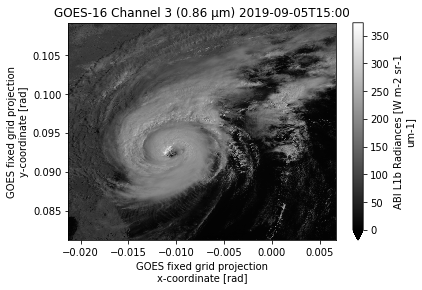

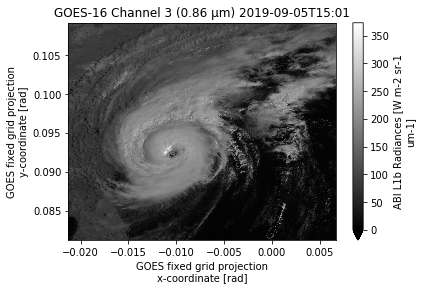

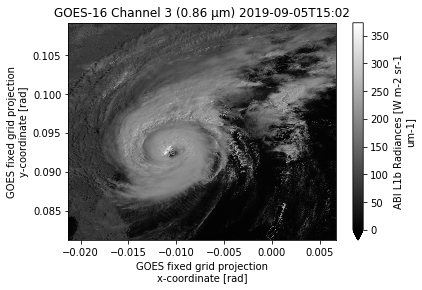

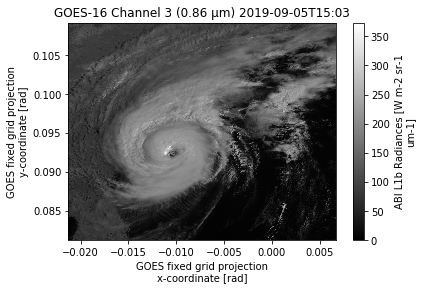

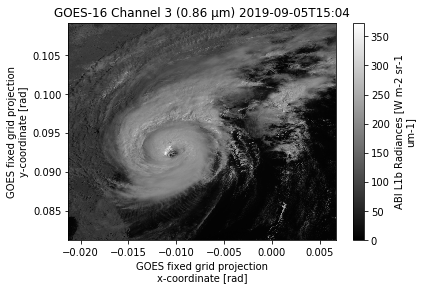

...

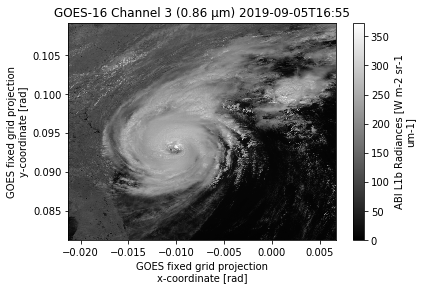

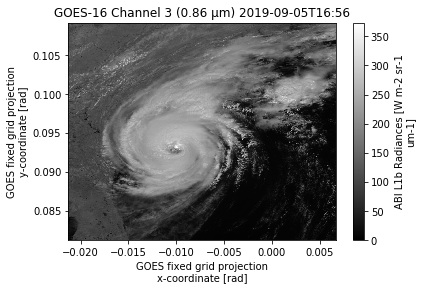

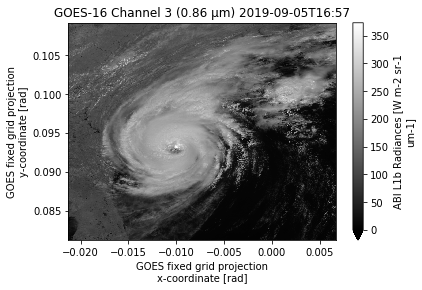

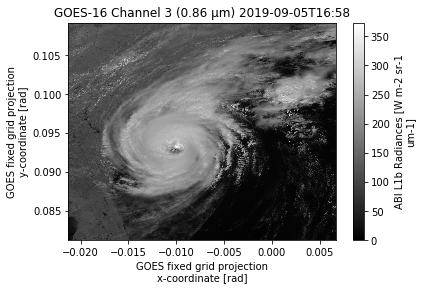

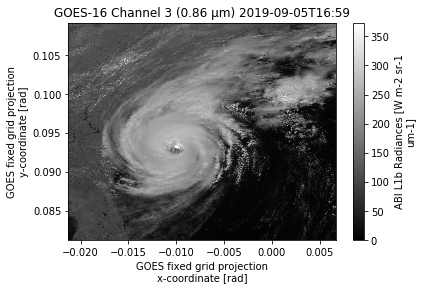

In [4]:
###################################################################
#
# Generate Figures for Each Image
#

for file in file_list :
    full_url = opendap_root + file
    image_file = xr.load_dataset(full_url)
    time  = image_file.t.values
    image = image_file.Rad
    image.plot(cmap='gray', vmin = 0)
    plt.title("GOES-16 Channel " + str(selected_channel) + " (" + wavelength[selected_channel] + ") " + np.datetime_as_string(time, unit='m'))
    plt.show()
    

figure_size = plt.rcParams["figure.figsize"] 

#
###################################################################

## Producing an Animated Image

Finally we are producing an amimated image of the satellite data.

Step one is to create the frame generating function.



In [5]:
###################################################################
#
# Create Image Frame Function for Animation
# 

def update_goes_frame(time_step):
    full_url = opendap_root + file_list[time_step]
    image_file = xr.load_dataset(full_url)
    time  = image_file.t.values
    image = image_file.Rad
    plt.gcf().clf()  # clear the current graph 
    image.plot(cmap='gray', vmin = 0)
    plt.title("GOES-16 Channel " + 
              str(selected_channel) + 
              " (" + 
              wavelength[selected_channel] 
              + 
              ") " + 
              np.datetime_as_string(time, unit='m'))
    
#
###################################################################

We now generate the figure itself

Producing Animation (you need to be patient here)


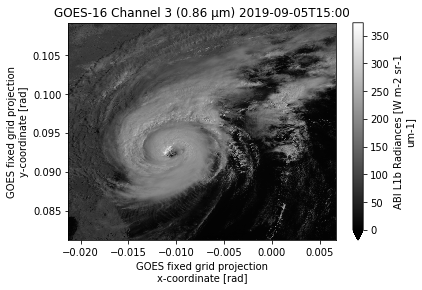

In [6]:
####################################################################
#
# Create the Animation Figure
#

print("Producing Animation (you need to be patient here)")


#
# We first create the subplot canvas
#

fig, ax = plt.subplots(figsize = figure_size)

#
# and here is where we create the animation
#

ani = animation.FuncAnimation(fig,                     # the graphical "device"
                              update_goes_frame,       # the update "function"
                              frames=total_time_steps) # the loop to run through

#
# Drop to an animated GIF
#

ani.save(filename = './GOES-16_Dorian_CH-' + 
                    '{:02d}'.format(selected_channel) + 
                    '.gif', 
         writer   = 'imagemagick')

#
# finally we can drop the animation into our Jupyter notebook.
#
# (this takes a while)  It also doesn't always work for 
#   big figures
#

display.HTML(ani.to_html5_video())


#
###################################################################

---

## Version Information

In [7]:
################################################################
#
# Loading Version Information
#

%load_ext version_information
%version_information numpy, matplotlib, urllib3, xarray, datetime, version_information

#
################################################################

Software versions
Python 3.7.3 64bit [Clang 11.0.0 (clang-1100.0.33.12)]
IPython 7.9.0
OS Darwin 19.0.0 x86_64 i386 64bit
numpy 1.17.4
matplotlib 3.1.1
urllib3 1.25.7
xarray 0.14.0
datetime The 'datetime' distribution was not found and is required by the application
version_information 1.0.3
Wed Dec 04 13:28:40 2019 MST